In [16]:
options(warn=-1)

#home 
setwd("C://Users//Cherch//DataScience//project")

#work 
#setwd("C://bb//DataScience//project")


require("caret")
require("openxlsx")
require("tidyverse")
require(devtools)
library(dplyr)
library(car)


protocol<-read.xlsx("../project/BoxOffice - Data Retrieval Protocol.xlsx", sheet = "protocol")

head(protocol)

rownames(protocol) <- str_trim(protocol$Feature.name)

load("../data/BoxOffice_ff.RData")

load("../data/BoxOffice_ff_with_ouliers.RData")



,Feature.name,Source,Value.type,Scale,Data.type,Unique.count,Measure.unit,Conversion.factor,Min,Max,Outlier.treatment,Null,Outlier.Notes,Categories.num,Categories.names
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>
1,movie_id,movies,Categorical,Nominal,Decimal,NA,NA,NA,1,7398,NA,NA,NA,NA,NA
2,depart_Lighting_female,movie_crew LEFT OUTER JOIN crew_dim,Categorical,Ratio,Decimal,2,NA,NA,0,1,Categorize,NA,due to low variability,"0,1,2","None, Exist"
3,original_language,movies,Categorical,Nominal,Text,44,NA,NA,NA,NA,Leave,NA,NA,NA,NA
4,sw_collection,movie_collection,Categorical,Ratio,Decimal,3,NA,NA,0,2,Leave,NA,Movies belongin to multiple collections look like an error (check movie_id= 555),NA,NA
5,depart_Visual_Effects_female,movie_crew LEFT OUTER JOIN crew_dim,Categorical,Ratio,Decimal,3,NA,NA,0,2,Categorize,NA,due to low variability,"0,1,2","None, Exist"
6,runtime_cat,movies,Categorical,Ordinal,Text,3,NA,NA,1,3,Leave,NA,NA,NA,NA


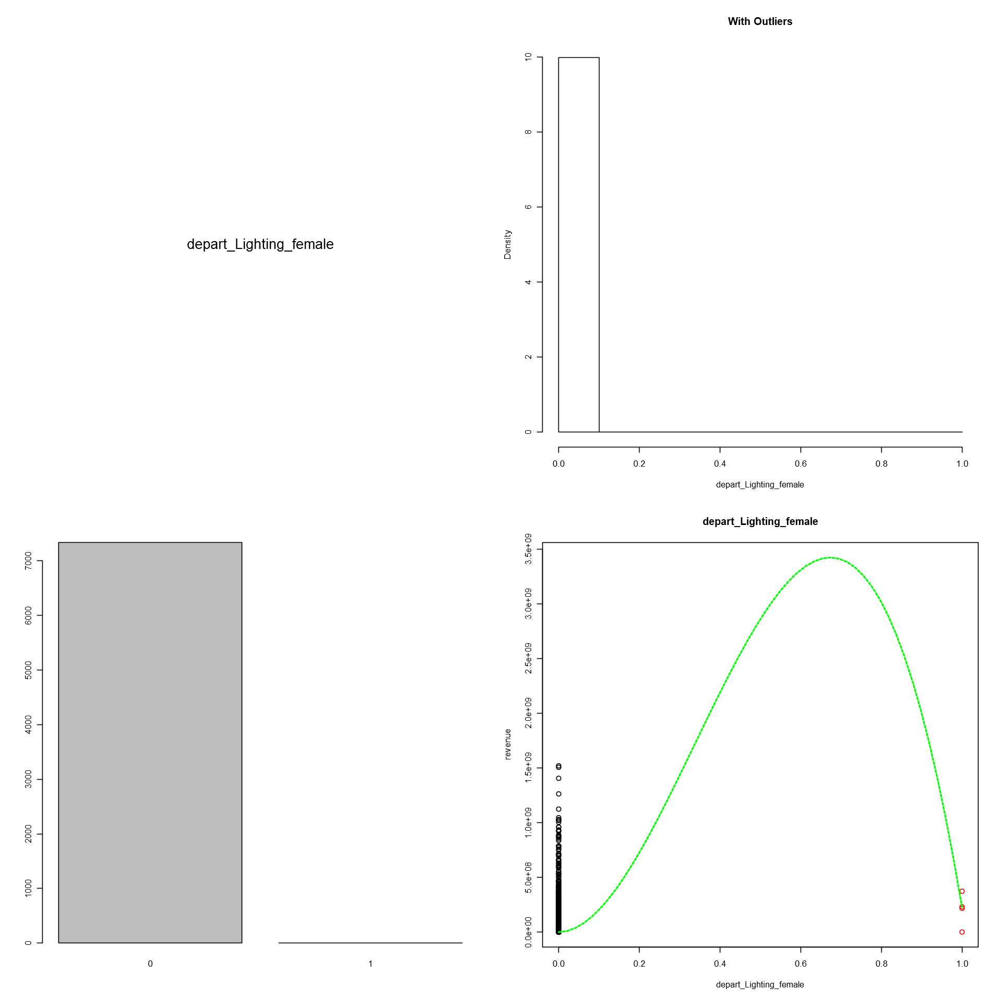

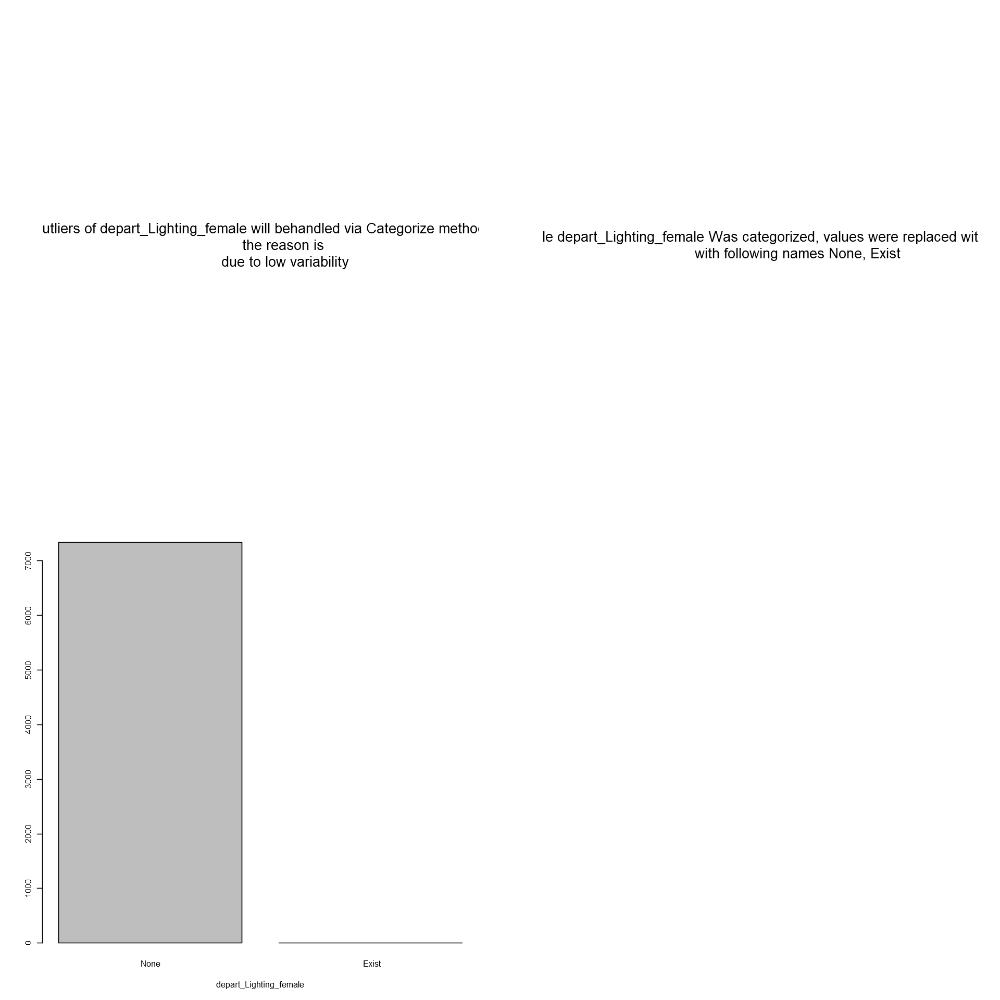

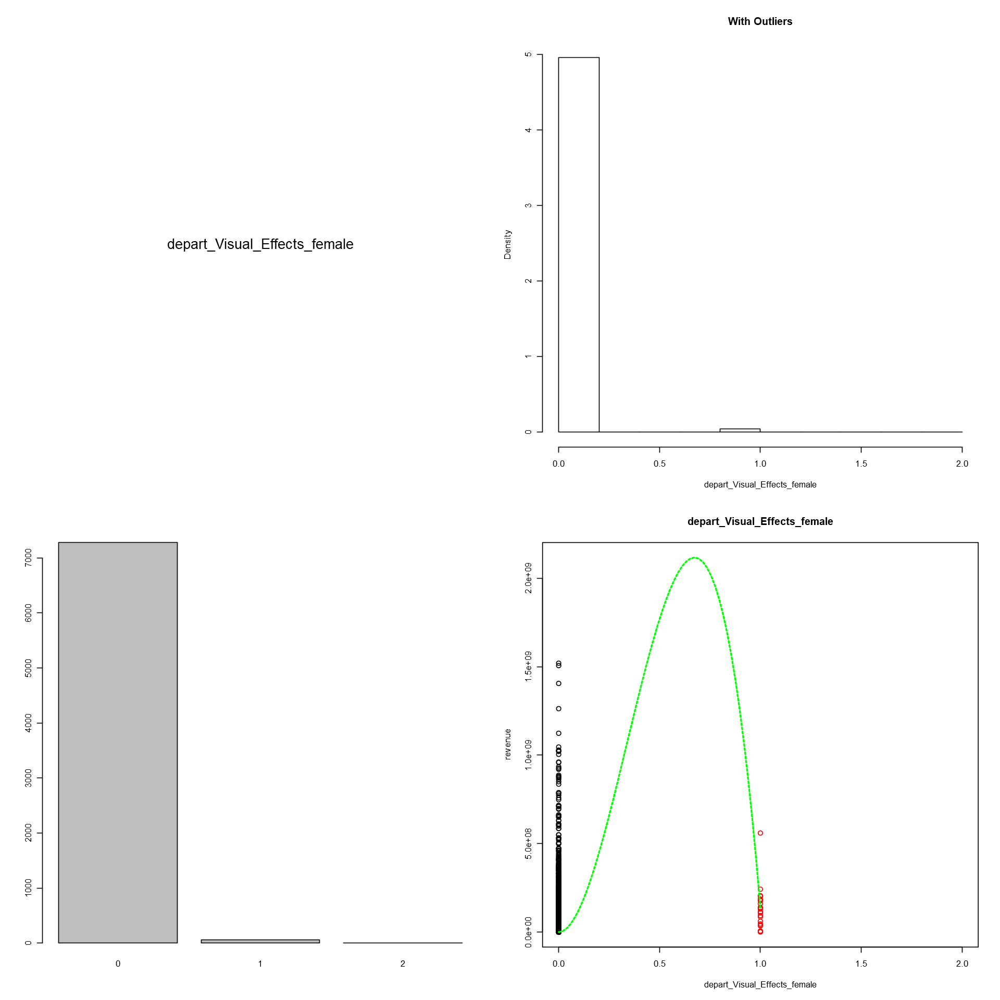

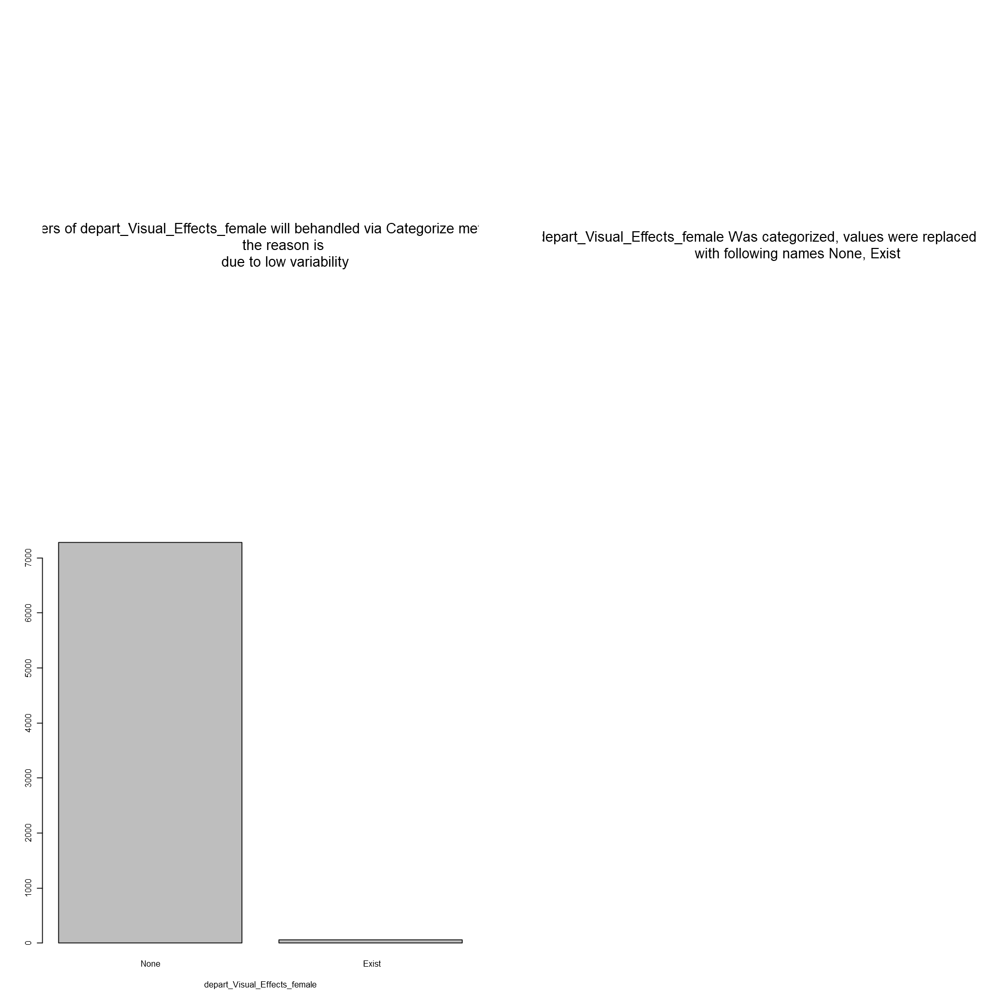

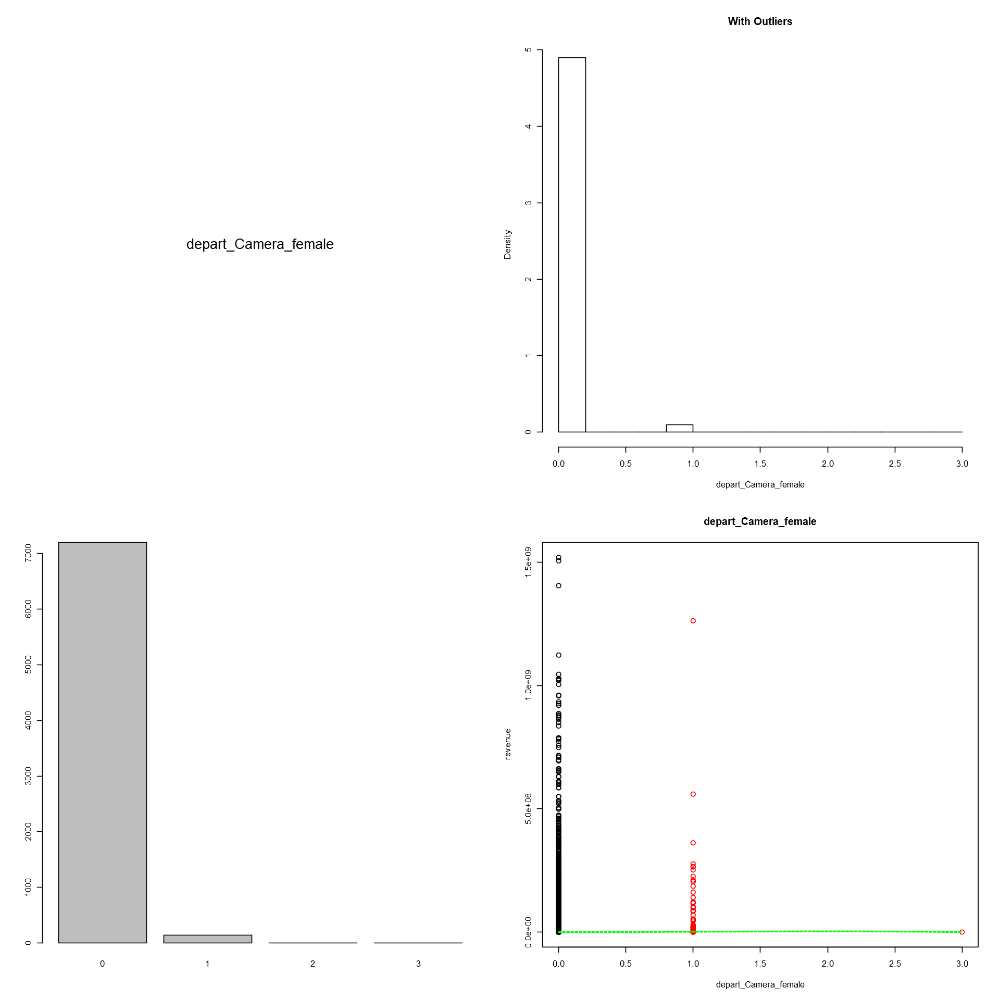

...

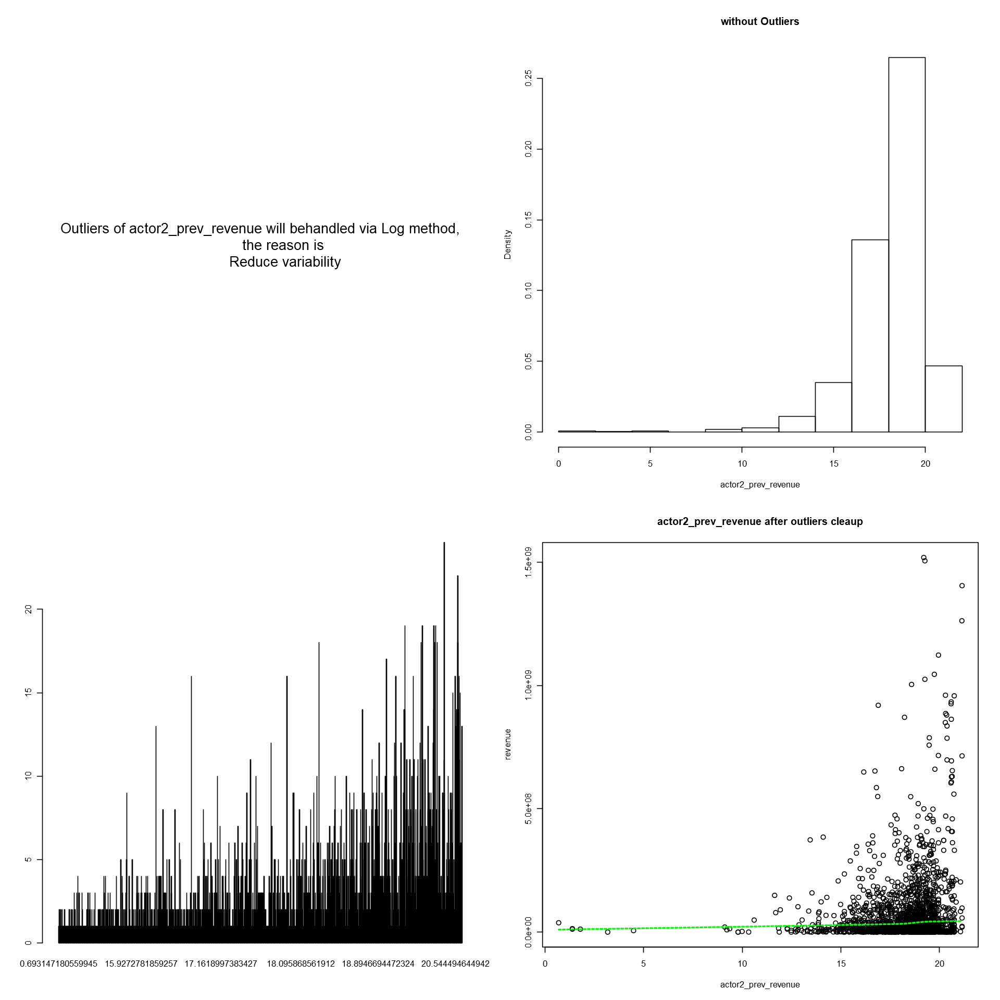

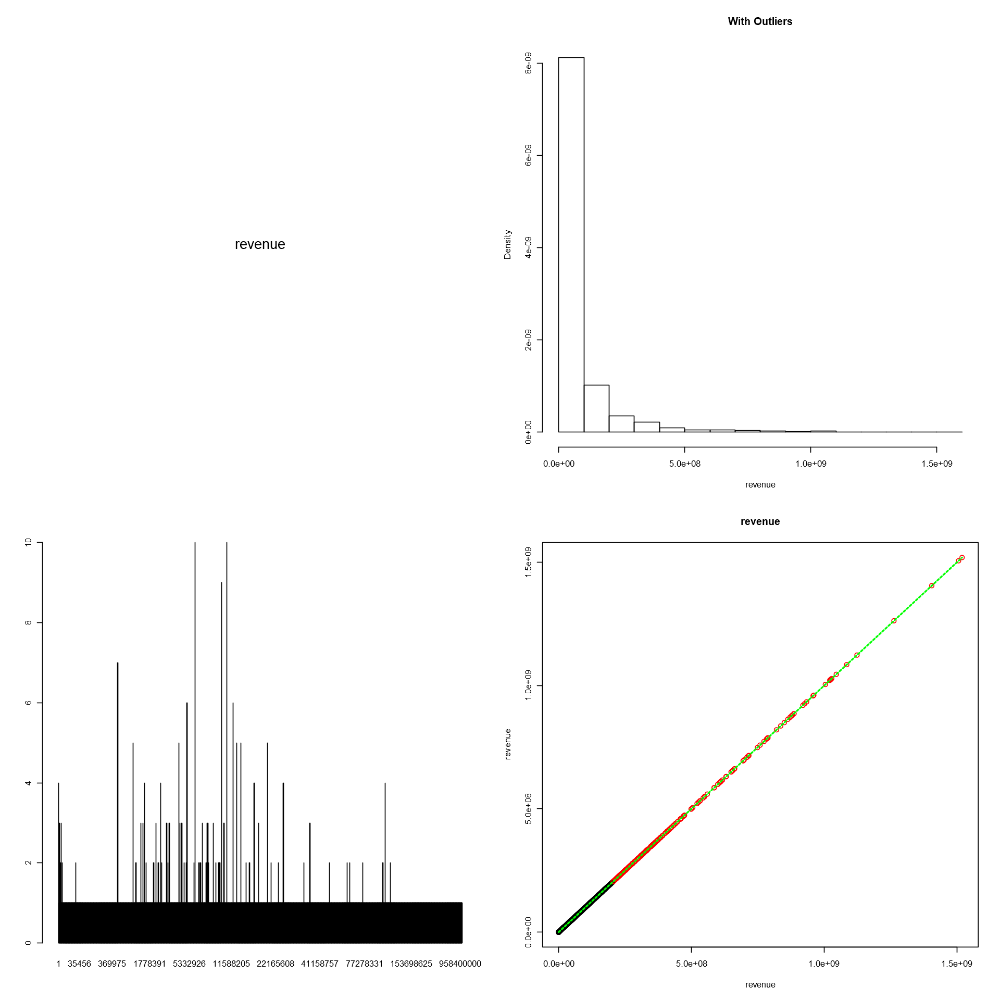

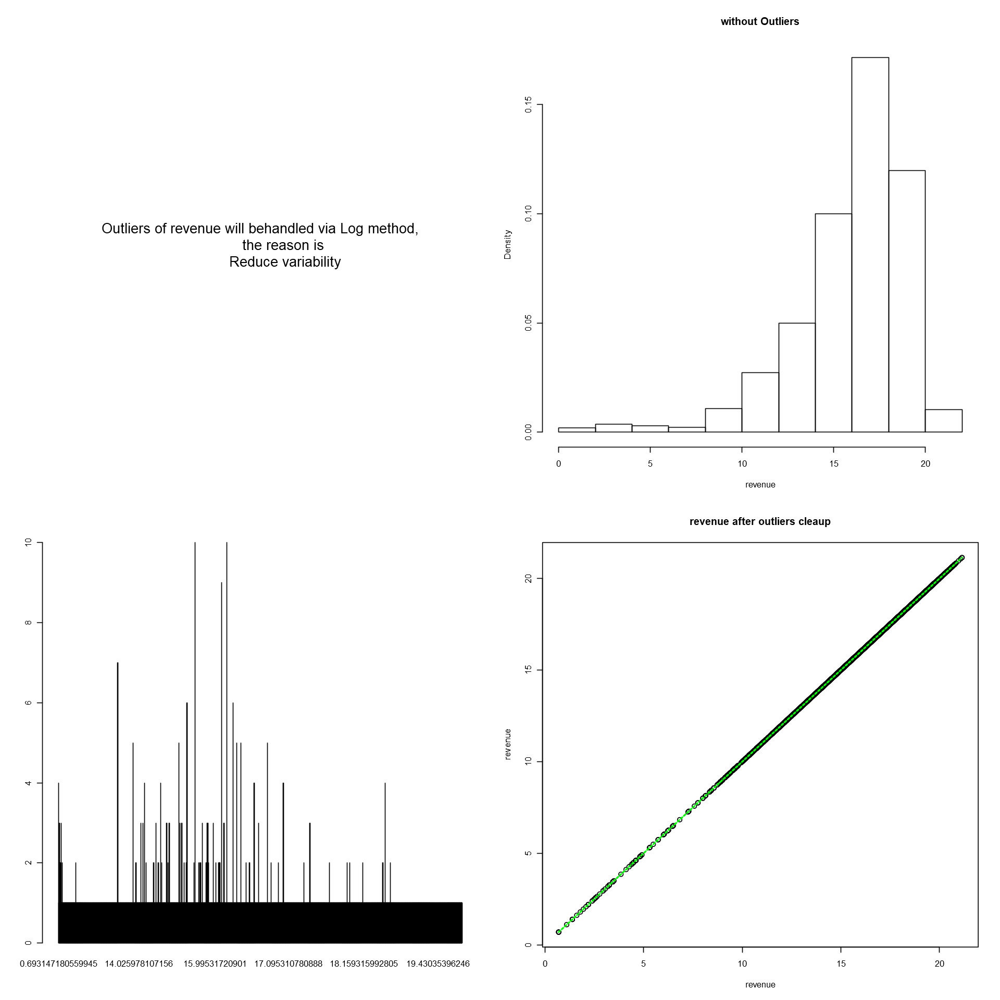

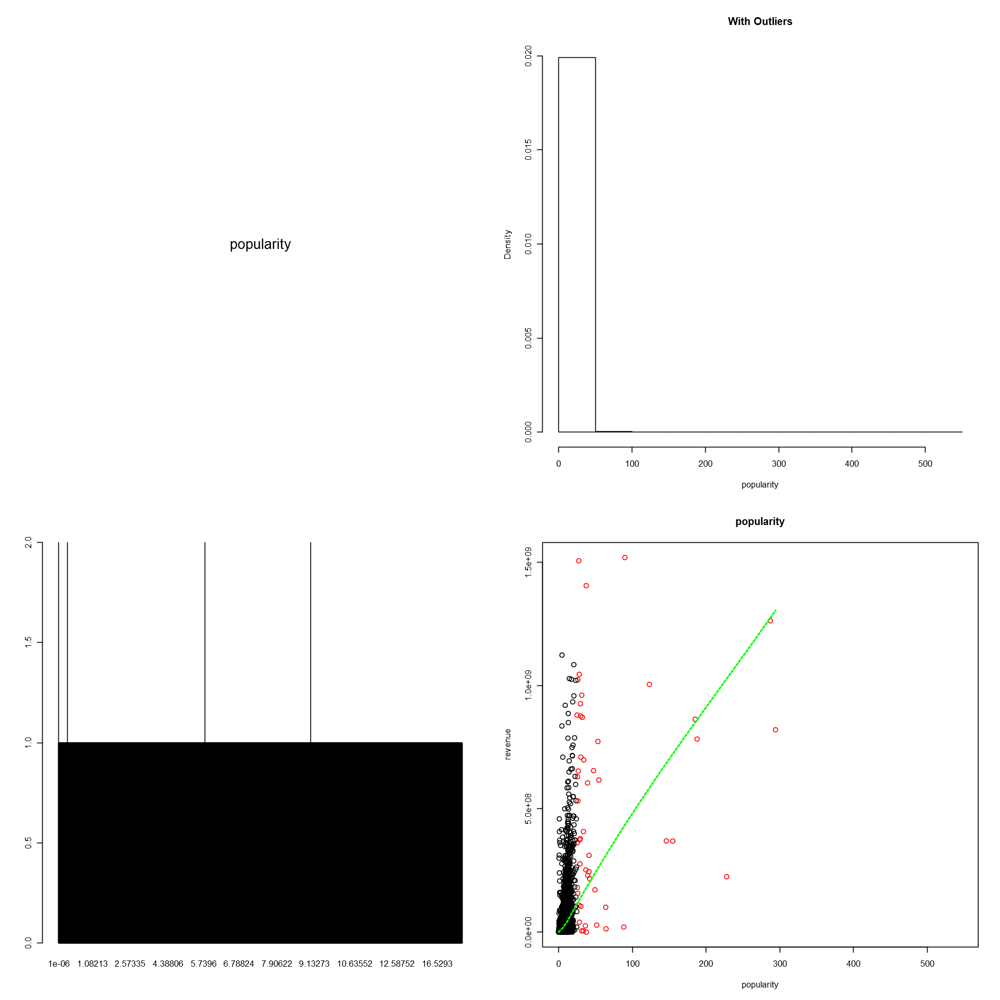

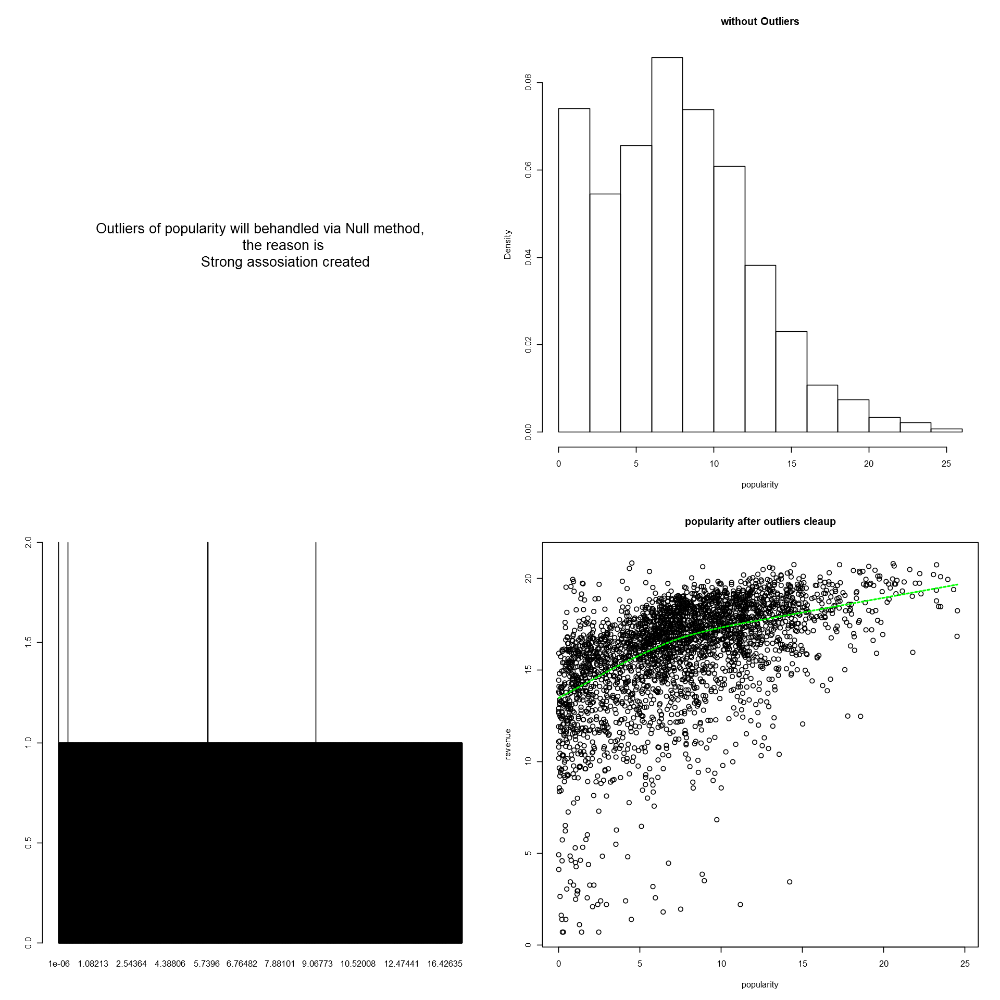

In [12]:
options(warn=-1)

# list all the numeric variables
numerics<-str_trim(protocol$Feature.name[protocol$Value.type == "Numeric"])


outlierMatrix <- function(data,threshold=1.5) {
  vn <- names(data)
  outdata <- data.frame(row1=1:nrow(data))
  for(v in vn) {
    if(is.numeric(data[[v]])) {
      med<- median(data[[v]], na.rm = T)
      outlow <- quantile(data[[v]],probs = 0.25,na.rm = T)
      outhigh <- quantile(data[[v]],probs = 0.75, na.rm = T)
      irq_level <- (outhigh - outlow) * threshold
      outlow <- outlow - irq_level
      outhigh <- outhigh +  irq_level
      mv <- ifelse(data[[v]] < outlow | data[[v]] > outhigh, 1, 0)
      outdata[v] <- mv
    } else {
      mv <- rep(0,nrow(data))
    }
  }
  outdata$row1 <- NULL
  return(outdata)
}
##########################################################################################
outlierMatrixWinsorizing <- function(data, v, threshold=1.5) {
  if(is.numeric(data[[v]])) {
    med<- median(data[[v]], na.rm = T)
    outlow <- quantile(data[[v]],probs = 0.25,na.rm = T)
    outhigh <- quantile(data[[v]],probs = 0.75, na.rm = T)
    irq_level <- (outhigh - outlow) * threshold
    outlow <- outlow - irq_level
    outhigh <- outhigh +  irq_level

    data[data[[v]] < outlow, v]<-outlow

    data[data[[v]] > outhigh, v]<-outhigh

  } else {
    mv <- rep(0,nrow(data))
  }

  return(data)
}

##########################################################################################

movies_threshold<-2.0

out<-outlierMatrix(movies,threshold = movies_threshold)


ocmovies<-movies

options(repr.plot.width = 16, repr.plot.height = 16)
for(v in numerics) {
  #look on variable with some variability


  par(mfrow=c(2,2))
  #options(repr.plot.width = 8, repr.plot.height = 4)

  plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
  text(x = 0.5, y = 0.5, v,
       cex = 1.6, col = "black")

  hist(movies[[v]], freq = FALSE, xlab = v,  main = "With Outliers")

  barplot(table(movies[[v]]))

  
  scatter.smooth(movies[['revenue']] ~ movies[[v]], main=v, xlab=v ,ylab="revenue", family="symmetric",
                 lpars =list(col = "green", lwd = 2, lty = 2), col=out[[v]]+1)




  ##############################
  #Handle outliers
  ##############################

  mes<-sprintf("Outliers of %s will behandled via %s method,
            the reason is \
            %s",v,
            protocol[v, "Outlier.treatment"],
            protocol[v, "Outlier.Notes"])



  if (protocol[v,"Outlier.treatment"] == "Leave"){

    par(mfrow=c(1,2))
    
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, mes,
         cex = 1.6, col = "black")
    
    #options(repr.plot.width = 8, repr.plot.height = 4)
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, paste("Do nothing for", v),
         cex = 1.6, col = "black")

  } else if (protocol[v,"Outlier.treatment"] == "Null"){

    #drop outlier value (replace by NA)
    ocmovies[which(out[v] == 1), v]<-NA


    par(mfrow=c(2,2))
    
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, mes,
         cex = 1.6, col = "black")
    
    #options(repr.plot.width = 8, repr.plot.height = 8)
    hist(ocmovies[[v]], freq = FALSE, xlab = v,  main = "without Outliers")

    barplot(table(ocmovies[[v]]))

    
    scatter.smooth(ocmovies[['revenue']] ~ ocmovies[[v]], main=paste(v, "after outliers cleaup"), xlab=v ,ylab="revenue", family="symmetric",
                   lpars =list(col = "green", lwd = 2, lty = 2))
    

  } else if (protocol[v,"Outlier.treatment"] == "Log"){

    ocmovies[[v]]<-log(movies[[v]] + 1)


    par(mfrow=c(2,2))
    
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, mes,
         cex = 1.6, col = "black")
    
    hist(ocmovies[[v]], freq = FALSE, xlab = v,  main = "without Outliers")

    barplot(table(ocmovies[[v]]))

    scatter.smooth(ocmovies[['revenue']] ~ ocmovies[[v]], main=paste(v, "after outliers cleaup"), xlab=v ,ylab="revenue", family="symmetric",
                   lpars =list(col = "green", lwd = 2, lty = 2))
    

  } else if (protocol[v,"Outlier.treatment"] == "Sqrt"){

    ocmovies[[v]]<-sqrt(movies[[v]] + 1)

    par(mfrow=c(2,2))
    
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, mes,
         cex = 1.6, col = "black")
    
    hist(ocmovies[[v]], freq = FALSE, xlab = v,  main = "without Outliers")

    barplot(table(ocmovies[[v]]))

    scatter.smooth(ocmovies[['revenue']] ~ ocmovies[[v]], main=paste(v, "after outliers cleaup"), xlab=v ,ylab="revenue", family="symmetric",
                   lpars =list(col = "green", lwd = 2, lty = 2))
    

  } else if (protocol[v,"Outlier.treatment"] == "Winsorizing"){

    ocmovies<-outlierMatrixWinsorizing(movies, v, movies_threshold)


    par(mfrow=c(2,2))
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, mes,
         cex = 1.6, col = "black")
    
    hist(ocmovies[[v]], freq = FALSE, xlab = v,  main = "without Outliers")

    barplot(table(ocmovies[[v]]))

    scatter.smooth(ocmovies[['revenue']] ~ ocmovies[[v]], main=paste(v, "after outliers cleaup"), xlab=v ,ylab="revenue", family="symmetric",
                   lpars =list(col = "green", lwd = 2, lty = 2))
    

  } else if (protocol[v,"Outlier.treatment"] == "Categorize"){

    cat_num<-protocol[v,"Categories.num"]
    cat_num_vec<-unlist(strsplit(cat_num, ","))


    cat_names<-protocol[v,"Categories.names"]
    cat_names_vec<-unlist(strsplit(cat_names, ","))

    ocmovies[[v]]<-cut(movies[[v]], breaks = as.numeric(cat_num_vec), labels = cat_names_vec,
                       right = FALSE)

    st<-sprintf("Numeric variable %s Was categorized, values were replaced with %s breaks \
                  with following names %s", v, cat_num, cat_names)

    par(mfrow=c(2,2))
    
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, mes,
         cex = 1.6, col = "black")
    
    plot(c(0, 1), c(0, 1), ann = F, bty = 'n', type = 'n', xaxt = 'n', yaxt = 'n')
    text(x = 0.5, y = 0.5, st,
         cex = 1.6, col = "black")
    
    plot(ocmovies[[v]], xlab = v)
  }

}
par(mfrow=c(1,1))

##########################################################################################
# Correlation Graph
##########################################################################################


corrplot 0.84 loaded



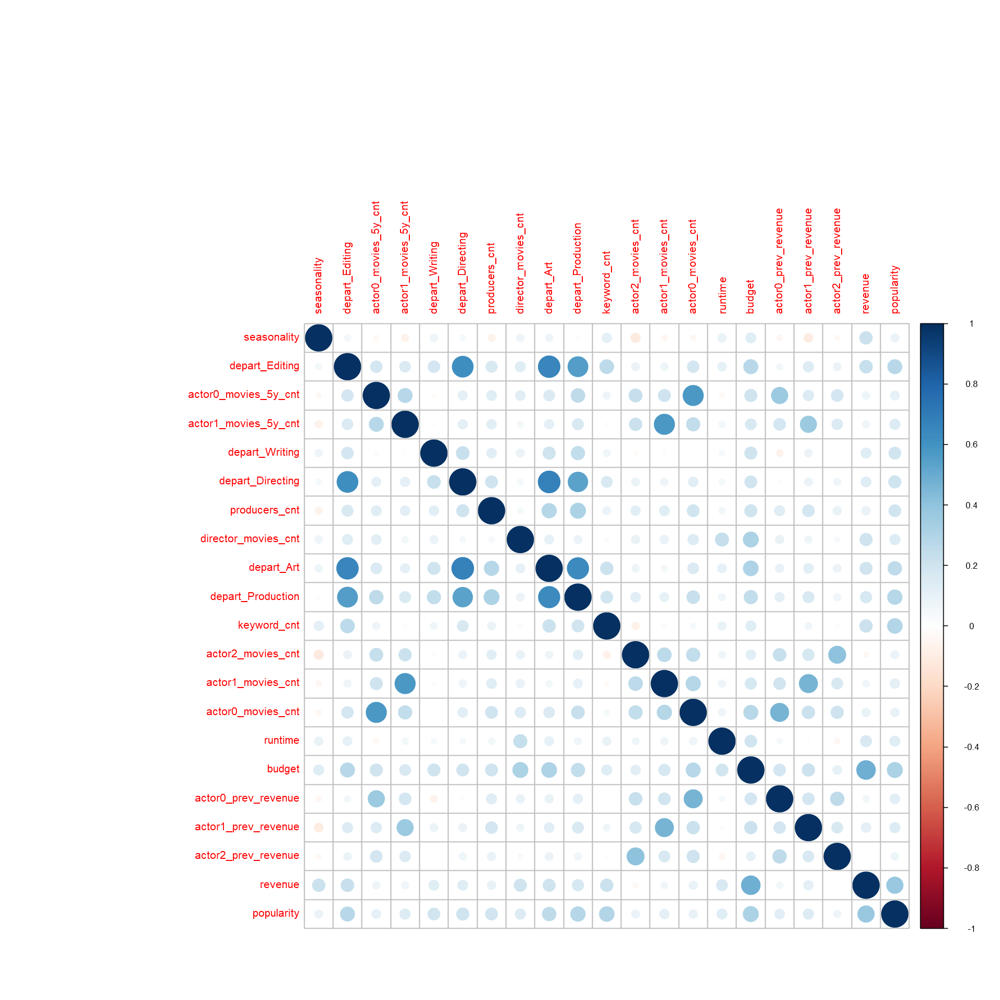

In [17]:

# list all the numeric variables
numerics<-str_trim(protocol$Feature.name[protocol$Value.type == "Numeric"])


#install.packages("corrplot")
library(corrplot)

corr<-cor(ocmovies[numerics], method = "pearson", use = "complete.obs")

corrplot(corr, method="circle")
